In computational neuroscience, the salamnder dataset represents "spike trains." Each row corresponds to a neuron (feature), and each column corresponds to a time bin (sample). A value of 1 means a neuron fired in that window; 0 means it was silent.

The data has:
- Dimension 1: 297 repeats (trials).
- Dimension 2: 160 subset of the neurons.
- Dimension 3: 953 time bins per repeat.

The dataset is a spatiotemporal binary map of retinal activity:Binary Values: Each entry is a $0$ or $1$. A $1$ indicates that the specific neuron at that specific time bin during that specific repeat fired an action potential7.N-bit Binary Samples: At any single time bin ($t$), the state of the retina is represented by an $N$-bit vector (where $N=160$ in the file).

In [14]:
using Pkg
Pkg.activate(joinpath(@__DIR__, "..", "..", ".."))  # go up three levels (from PauliSampling.jl\numerics\quantumboltzmannmachine\ceofficient_truncation to to PauliSampling.jl)

  Activating project at `~/Desktop/PauliSampling.jl`


In [15]:
# Load all packages
using PauliSampling, PauliPropagation, Plots, LinearAlgebra, ProgressMeter, Statistics, Printf, Distributions, Random, Optimisers, ReverseDiff, MAT, BenchmarkTools, IterTools, StatsBase, LaTeXStrings, Measures, CSV, DataFrames, JSON3, Dates, PyPlot, Optim, Combinatorics
using Plots: plot
using LinearAlgebra: norm

In [2]:
# Define the file path
file_path = "/Users/micheleminervini/Desktop/PauliSampling.jl/datasets/salamander.mat"

"/Users/micheleminervini/Desktop/PauliSampling.jl/datasets/salamander.mat"

In [3]:
# 1. Load the data
file = matopen(file_path)
# 2. Read the bint matrix
# Dimensions: [Repeat, Neuron, TimeBin]
raw_data = read(file, "bint")
close(file)

In [4]:
# 3. Slicing
# We select:
# - The 1st repeat (Dimension 1)
# - The first 8 neurons/features (Dimension 2)
# - The first 10 time bins/recordings (Dimension 3)
target_data = raw_data[1, 1:8, 1:10]

8×10 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

This is to demonstrate that the QBM could learn a highly peaked distribution (where only 1 or 2 states have high probability). This is a "sanity check" for the algorithm.

In [6]:
# 1. Setup dimensions
n_neurons = size(target_data, 1)  # 8
n_samples = size(target_data, 2)  # 10

# 2. Initialize a Vector{Float64} of length 2^8 = 256
# All probabilities are 0.0 by default
probs = zeros(Float64, 2^n_neurons)

# 3. Populate the vector by iterating through each time bin (column)
for j in 1:n_samples
    # Get the 8-bit vector for the current recording
    sample_vec = target_data[:, j]
    
    # Convert binary vector to a decimal integer (0 to 255)
    # Logic: decimal = b1*2^7 + b2*2^6 + ... + b8*2^0
    decimal_idx = 0
    for i in 1:n_neurons
        decimal_idx += Int(sample_vec[i]) * 2^(n_neurons - i)
    end
    
    # Increment the count for this specific state
    # Note: Julia is 1-indexed, so decimal 0 maps to index 1
    probs[decimal_idx + 1] += 1.0
end

# 4. Normalize to get the actual probabilities
probs ./= n_samples

# 5. Verification
println("Total number of states: ", length(probs))
println("Sum of probabilities: ", sum(probs))
println("Non-zero probability indices: ", findall(!iszero, probs) .- 1)

Total number of states: 256
Sum of probabilities: 1.0
Non-zero probability indices: [0, 16]


In [8]:
bitstrings = [lpad(string(i, base=2), n_neurons, '0') for i in 0:(2^n_neurons - 1)];

Quantum state encoding

In [10]:
function encode_distribution_to_pure_state(n::Int, bitstrings::Vector{String}, probs::Vector{Float64})
    D = 2^n
    
    if length(bitstrings) != length(probs)
        throw(ArgumentError("Bitstrings and probabilities must have the same length."))
    end

    # 1. Create the Pure State Vector |ψ⟩
    psi_vector = zeros(D)
    
    # Check normalization and get square roots
    sum_probs = sum(probs)
    if !isapprox(sum_probs, 1.0)
         @warn "Input probabilities sum to $(sum_probs). Renormalizing."
         probs = probs ./ sum_probs
    end
    
    # Calculate amplitudes (assuming phase α(s) = 0)
    amplitudes = sqrt.(probs)
    
    for (i, x) in enumerate(bitstrings)
        # Convert the bitstring (e.g., "101") to its 1-based index (6)
        # Index = 1 + binary_to_integer(x)
        idx = parse(Int, x, base=2) + 1 
        
        # Set the amplitude at the corresponding basis state index
        psi_vector[idx] = amplitudes[i]
    end
    
    # 2. Create the Pure State Density Matrix η = |ψ⟩⟨ψ|
    # Outer product of the vector with itself (conjugate transpose)
    eta_matrix = psi_vector * transpose(psi_vector) 
    
    # 3. Define Target Probabilities (Eigenvalues)
    # A pure state always has one eigenvalue of 1 and the rest are 0.
    target_probs = zeros(D)
    target_probs[1] = 1.0 # The one non-zero eigenvalue
    
    return eta_matrix, target_probs
end

encode_distribution_to_pure_state (generic function with 1 method)

In [11]:
nq = n_neurons
target_eta_matrix, target_probs = encode_distribution_to_pure_state(nq, bitstrings, probs);

Plotting

In [16]:
function plot_classical_distribution(n::Int, bitstrings::Vector{String}, probs::Vector{Float64}, title::String)
    
    N_states = length(bitstrings)
    
    # --- 1. Determine X-Axis Ticks ---
    # For small n (e.g., n=4), show all labels. For larger n (e.g., n=10), show only a subset.
    
    x_indices = 1:N_states
    x_labels = bitstrings

    # Filter labels to prevent clutter on larger systems (e.g., only show 1 in 16 labels)
    label_step = n <= 6 ? 1 : round(Int, N_states / 16) 
    label_indices = 1:label_step:N_states
    
    # Create an empty array for labels, only filling in the chosen steps
    tick_labels = fill("", N_states)
    for idx in label_indices
        # Ensure the label is legible by using a small font or rotating
        tick_labels[idx] = bitstrings[idx] 
    end


    # --- 2. Initialize and Generate Plot ---
    
    p = plot(
        x_indices,
        probs,
        seriestype = :bar, # Use bar chart to show mass function
        bar_width = 1.0,   # Bars fill the entire x-space
        color = :dodgerblue,
        label = "P(s)",
        title = title * " (n=$(n))",
        xlabel = L"Bitstrings", 
        ylabel = L"Probability Mass",
        
        # Apply custom ticks and rotation
        xticks = (x_indices, tick_labels),
        xrotation = 45, 
        
        # Set y-axis to start at 0
        ylim = (0, 1.1 * maximum(probs)),
        grid = true,
        size = (800, 500),
        legend = false
    )

    return p
end

plot_classical_distribution (generic function with 1 method)

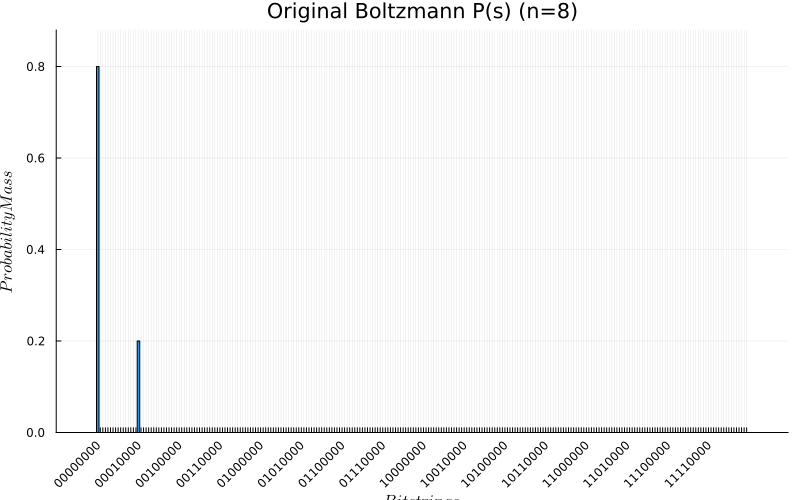

In [19]:
# 2. Visual Verification
p_original = plot_classical_distribution(nq, bitstrings, probs, 
                                         "Original Boltzmann P(s)")

## Training

In [20]:
# turn H::Vector{PauliString} into a coefficient vector
function coeffs_from_paulistrings(H)
    return [t.coeff for t in H]
end

# update coefficients inside H in place
function update_paulistring_coeffs!(H, coeffs)
    @assert length(H) == length(coeffs)
    for i in 1:length(H)
        H[i] = PauliString(H[i].nqubits, H[i].term, coeffs[i])
    end
end

update_paulistring_coeffs! (generic function with 1 method)

In [21]:
function loss_fun(coeffs, H_pauli, Gamma_eta)
    # H = deepcopy(H_template)
    update_paulistring_coeffs!(H_pauli, coeffs)
    return computequantumrelativeentropy(Gamma_eta, H_pauli)
end

function loss_fun(coeffs, H, target_eta_matrix, target_probs)
    # H = deepcopy(H_template)
    update_paulistring_coeffs!(H, coeffs)
    Hmat = paulistringtomatrix(H)
    return computequantumrelativeentropy(target_eta_matrix, target_probs, Hmat)
end

function grad_fun!(g, coeffs, H, target_eta_matrix,
                   nq, num_layers, max_weight, min_abs_coeff)

    # H = deepcopy(H_template)
    update_paulistring_coeffs!(H, coeffs)

    circuit, theta = paulistringtocircuit(H)
    rho = makethermalstate(nq, circuit, theta, num_layers;
                           max_weight=max_weight,
                           min_abs_coeff=min_abs_coeff)

    grads = computegradients(H, target_eta_matrix, rho)

    g .= grads  # Optim requires writing into g in-place
end

grad_fun! (generic function with 1 method)

In [22]:
field_scale = 0.5       # typical order of magnitude for 1-local terms
coupling_scale = 0.3    # typical order for 2-local terms
rng = MersenneTwister(30)

# Initialize all parameters randomly
params = parameters(
    :heisenberg_fields, nq;
    init = :randn,
    field_scale = field_scale,
    coupling_scale = coupling_scale,
    rng = rng
)
beta = rand(rng, Uniform(1, 10))
qbm_H_paulis = makehamiltonian(params; connectivity=:nearest, periodic=false) * beta;

In [23]:
num_layers_qbm = nq * 10
max_weight_qbm = nq
min_abs_coeff_qbm = 1e-10;

In [24]:
initial_coeffs = coeffs_from_paulistrings(qbm_H_paulis)

opt = Optim.Options(
    iterations = 30000,
    show_trace = true,
    allow_f_increases = false,
    store_trace = true,
    extended_trace = true,
    g_tol = 1e-6,       # Stop if gradient is smaller than 0.0001
    f_tol = 1e-7,       # Stop if loss improves by less than 1e-9
)

result = optimize(
    coeffs -> loss_fun(coeffs, qbm_H_paulis, target_eta_matrix, target_probs),

    (g, coeffs) -> grad_fun!(
        g, coeffs,
        qbm_H_paulis, target_eta_matrix,
        nq, num_layers_qbm,
        max_weight_qbm, min_abs_coeff_qbm
    ),

    initial_coeffs,     # x0
    LBFGS(),            # method
    opt;                
)

Iter     Function value   Gradient norm 
     0     9.181732e+00     1.784199e+00
 * Current step size: 1.0
 * time: 0.016017913818359375
 * g(x): [-0.6541802689106273, 0.23959641948753793, 1.3423420003876856, 0.30404136043950014, 0.04511004229086101, 1.7841985699853793, 0.49685529973083253, -0.5073245910040515, 0.7970629062894841, 1.0123881113187896, 0.32481482754190627, 0.4725286260712244, 0.344590699577541, 0.16696454107268308, 1.3211307881042265, 0.15531354603711323, 0.4813952847308455, 1.219570717093617, 0.2365293445386139, 0.005458088775652155, 0.6800848977760938, -0.282330780890245, -0.7729868374466489, 0.6228491054330321, 0.2432463484618923, -0.003153439672070861, 0.6974848686329252, -0.18031072850855295, -0.018628780631065225, 1.1998411665468867, -0.16761645419958865, 0.08419392202476286, 0.6226857695911244, 0.010348835471104673, 0.032106735321668, 0.4694988385890736, 0.005204154897918654, -0.15969026042793377, 0.8700695218158452, -0.0044335313586512295, 0.0021731961283878447,

 * Status: failure (objective increased between iterations)

 * Candidate solution
    Final objective value:     8.712297e-04

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 4.39e-03 ≰ 0.0e+00
    |x - x'|/|x'|          = 8.92e-04 ≰ 0.0e+00
    |f(x) - f(x')|         = 8.71e-10 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.00e-06 ≰ 1.0e-07
    |g(x)|                 = 1.33e-03 ≰ 1.0e-06

 * Work counters
    Seconds run:   418  (vs limit Inf)
    Iterations:    7
    f(x) calls:    74
    ∇f(x) calls:   74


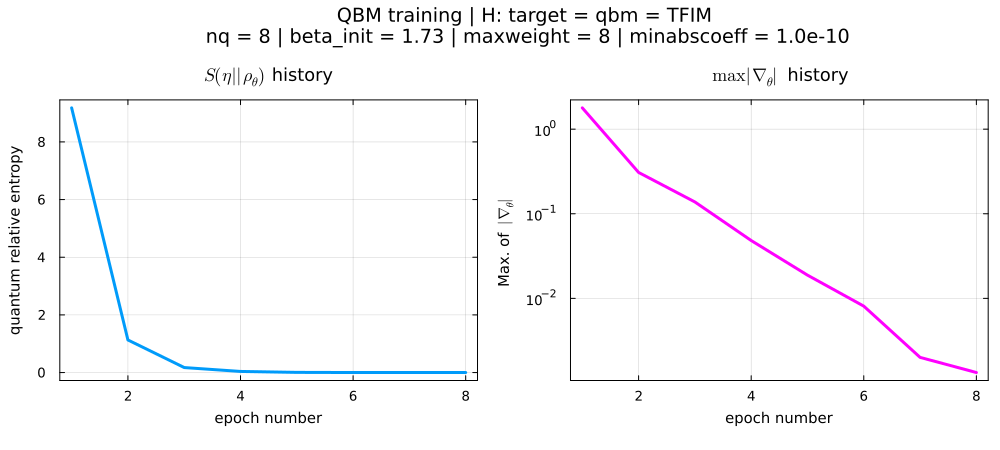

In [25]:
gr()

# ---- First plot ----
p1 = plot(Optim.f_trace(result),
    # xaxis = :log10,
    # yaxis = :log10,
    xlabel = "epoch number",
    ylabel = "quantum relative entropy",
    title = "\n" * "\n" * string(L"S\left(\!\eta || \!\rho\!_\theta\!\right)", " history"),
    legend = false,
    lw = 3,
    titlefont = font(12),
    guidefont = font(10),
    tickfont = font(9),
    margin = 5mm)

# ---- Second plot ----
p2 = plot(Optim.g_norm_trace(result),
    # xaxis = :log10,
    yaxis = :log10,
    xlabel = "epoch number",
    ylabel = "Max. of  " * L"|\!\nabla\!_\theta|",
    title = "\n" * "\n" * string(L"\max |\!\nabla\!_\theta|", " history"),  
    legend = false,
    color = :fuchsia,
    lw = 3,
    titlefont = font(12),
    guidefont = font(10),
    tickfont = font(9),
    margin = 5mm)

# ---- Combine side by side ----
combined = plot(
    p1, p2,
    layout = (1, 2),
    size = (1000, 450),
    plot_title = "QBM training | H: target = qbm = TFIM\n nq = $(nq) | beta_init = $(round(beta, digits=2)) | maxweight = $(max_weight_qbm) | minabscoeff = $(@sprintf("%.1e", min_abs_coeff_qbm))",
    plot_titlefont = font(13),
    bottom_margin = 9mm,  
    left_margin = 5mm,    
    right_margin = 1mm,
    top_margin = 10mm,
    framestyle = :box,
    titleloc = :center,
    spacing = 10mm       
)

display(combined)

In [27]:
circuit, theta = paulistringtocircuit(qbm_H_paulis)
rho = makethermalstate(nq, circuit, theta, num_layers_qbm;
                            max_weight=max_weight_qbm, min_abs_coeff=min_abs_coeff_qbm);

In [28]:
samples = 1000
# Sampling
counts = zeros(Int, 2^nq)

for _ in 1:samples
    bitstring = sample_bitstring(rho; prob_method=:approx)
    index = foldl((acc, b) -> 2*acc + b, reverse(bitstring), init=0) + 1  # convert BitVector to index (1-based)
    counts[index] += 1
end

empirical_probs = counts ./ samples;

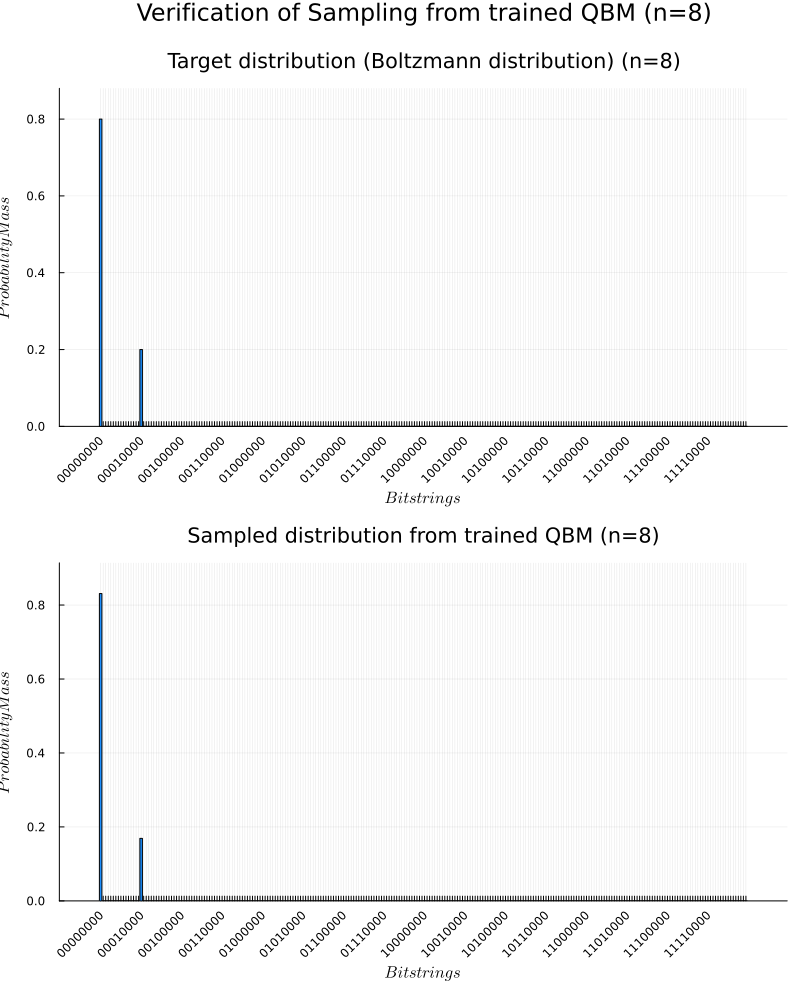

In [29]:
# 2. Visual Verification
p_original = plot_classical_distribution(nq, bitstrings, probs, 
                                         "Target distribution (Boltzmann distribution)")

p_empirical = plot_classical_distribution(nq, bitstrings, empirical_probs, 
                                        "Sampled distribution from trained QBM")

# Combine plots for visual comparison
plot(p_original, p_empirical, layout=(2, 1), size=(800, 1000), 
     plot_title="Verification of Sampling from trained QBM (n=$(nq))")

In [30]:
function total_variation_distance(p::AbstractVector, q::AbstractVector)
    length(p) == length(q) || error("Distributions must have the same length")
    return 0.5 * sum(abs.(p .- q))
end

total_variation_distance (generic function with 1 method)

In [31]:
tv = total_variation_distance(probs, empirical_probs)

0.030999999999999958

### with ising

In [32]:
field_scale = 0.5       # typical order of magnitude for 1-local terms
coupling_scale = 0.3    # typical order for 2-local terms
rng = MersenneTwister(30)

# Initialize all parameters randomly
params = parameters(
    :tfim, nq;
    init = :randn,
    field_scale = field_scale,
    coupling_scale = coupling_scale,
    rng = rng
)
beta = rand(rng, Uniform(1, 10))
qbm_H_paulis = makehamiltonian(params; connectivity=:nearest, periodic=false) * beta;

In [33]:
num_layers_qbm = nq * 10
max_weight_qbm = nq
min_abs_coeff_qbm = 1e-10;

In [34]:
initial_coeffs = coeffs_from_paulistrings(qbm_H_paulis)

opt = Optim.Options(
    iterations = 30000,
    show_trace = true,
    allow_f_increases = false,
    store_trace = true,
    extended_trace = true,
    g_tol = 1e-6,       # Stop if gradient is smaller than 0.0001
    f_tol = 1e-7,       # Stop if loss improves by less than 1e-9
)

result = optimize(
    coeffs -> loss_fun(coeffs, qbm_H_paulis, target_eta_matrix, target_probs),

    (g, coeffs) -> grad_fun!(
        g, coeffs,
        qbm_H_paulis, target_eta_matrix,
        nq, num_layers_qbm,
        max_weight_qbm, min_abs_coeff_qbm
    ),

    initial_coeffs,     # x0
    LBFGS(),            # method
    opt;                
)

Iter     Function value   Gradient norm 
     0     5.987019e+00     1.086086e+00
 * Current step size: 1.0
 * time: 0.00013899803161621094
 * g(x): [-0.49938480138743435, 0.21046689708738694, 0.3762958099266538, 0.944872705190808, 0.27571660713582924, 0.13701177286820135, 0.1767751621381614, -0.3038358206874787, 1.0609602620445928, 0.9291475456269337, 0.4870933863308319, 0.595455021777453, 1.0860861086566609, 0.9458149339225774, 0.9884087523560122]
 * x: [-0.549361800573162, 0.21433996857201792, 0.39843109697846646, 0.14655730793189128, 0.28379159836357226, 0.13836849438532817, 0.1788395038501422, -0.31375542409917306, 0.0681355702367613, -0.07584598290181327, -0.12024373203504156, -0.004700482181290574, 0.08919722813714064, -0.055172070114013774, -0.012100929876085131]
     1     1.672813e+00     3.515226e-01
 * Current step size: 4.452485053159393
 * time: 1.2610158920288086
 * g(x): [0.3515226394830916, -0.09924037188708831, -0.24141904119061677, 0.10888206629825548, -0.15853623439

 * Status: failure (objective increased between iterations)

 * Candidate solution
    Final objective value:     7.328205e-01

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.49e+00 ≰ 0.0e+00
    |x - x'|/|x'|          = 8.16e-02 ≰ 0.0e+00
    |f(x) - f(x')|         = 7.33e-07 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.00e-06 ≰ 1.0e-07
    |g(x)|                 = 1.82e-02 ≰ 1.0e-06

 * Work counters
    Seconds run:   24  (vs limit Inf)
    Iterations:    9
    f(x) calls:    80
    ∇f(x) calls:   80


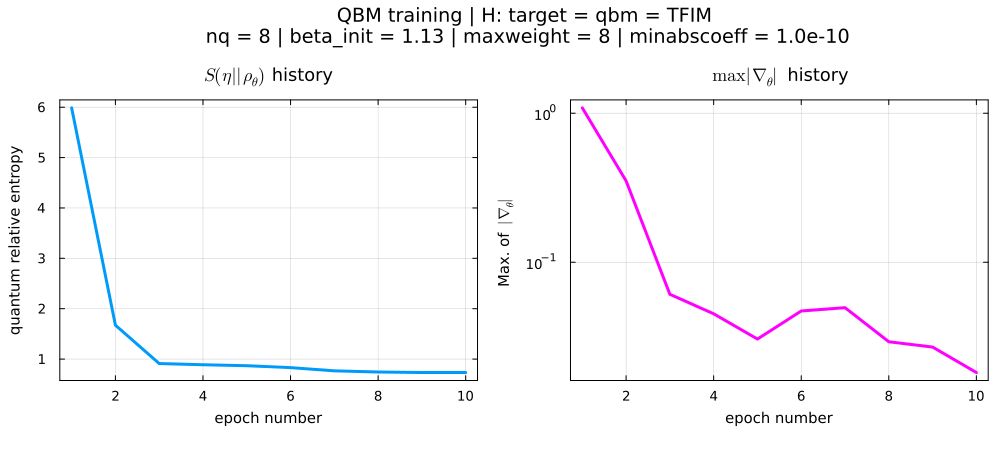

In [35]:
gr()

# ---- First plot ----
p1 = plot(Optim.f_trace(result),
    # xaxis = :log10,
    # yaxis = :log10,
    xlabel = "epoch number",
    ylabel = "quantum relative entropy",
    title = "\n" * "\n" * string(L"S\left(\!\eta || \!\rho\!_\theta\!\right)", " history"),
    legend = false,
    lw = 3,
    titlefont = font(12),
    guidefont = font(10),
    tickfont = font(9),
    margin = 5mm)

# ---- Second plot ----
p2 = plot(Optim.g_norm_trace(result),
    # xaxis = :log10,
    yaxis = :log10,
    xlabel = "epoch number",
    ylabel = "Max. of  " * L"|\!\nabla\!_\theta|",
    title = "\n" * "\n" * string(L"\max |\!\nabla\!_\theta|", " history"),  
    legend = false,
    color = :fuchsia,
    lw = 3,
    titlefont = font(12),
    guidefont = font(10),
    tickfont = font(9),
    margin = 5mm)

# ---- Combine side by side ----
combined = plot(
    p1, p2,
    layout = (1, 2),
    size = (1000, 450),
    plot_title = "QBM training | H: target = qbm = TFIM\n nq = $(nq) | beta_init = $(round(beta, digits=2)) | maxweight = $(max_weight_qbm) | minabscoeff = $(@sprintf("%.1e", min_abs_coeff_qbm))",
    plot_titlefont = font(13),
    bottom_margin = 9mm,  
    left_margin = 5mm,    
    right_margin = 1mm,
    top_margin = 10mm,
    framestyle = :box,
    titleloc = :center,
    spacing = 10mm       
)

display(combined)

In [36]:
circuit, theta = paulistringtocircuit(qbm_H_paulis)
rho = makethermalstate(nq, circuit, theta, num_layers_qbm;
                            max_weight=max_weight_qbm, min_abs_coeff=min_abs_coeff_qbm);

In [37]:
samples = 1000
# Sampling
counts = zeros(Int, 2^nq)

for _ in 1:samples
    bitstring = sample_bitstring(rho; prob_method=:approx)
    index = foldl((acc, b) -> 2*acc + b, reverse(bitstring), init=0) + 1  # convert BitVector to index (1-based)
    counts[index] += 1
end

empirical_probs = counts ./ samples;

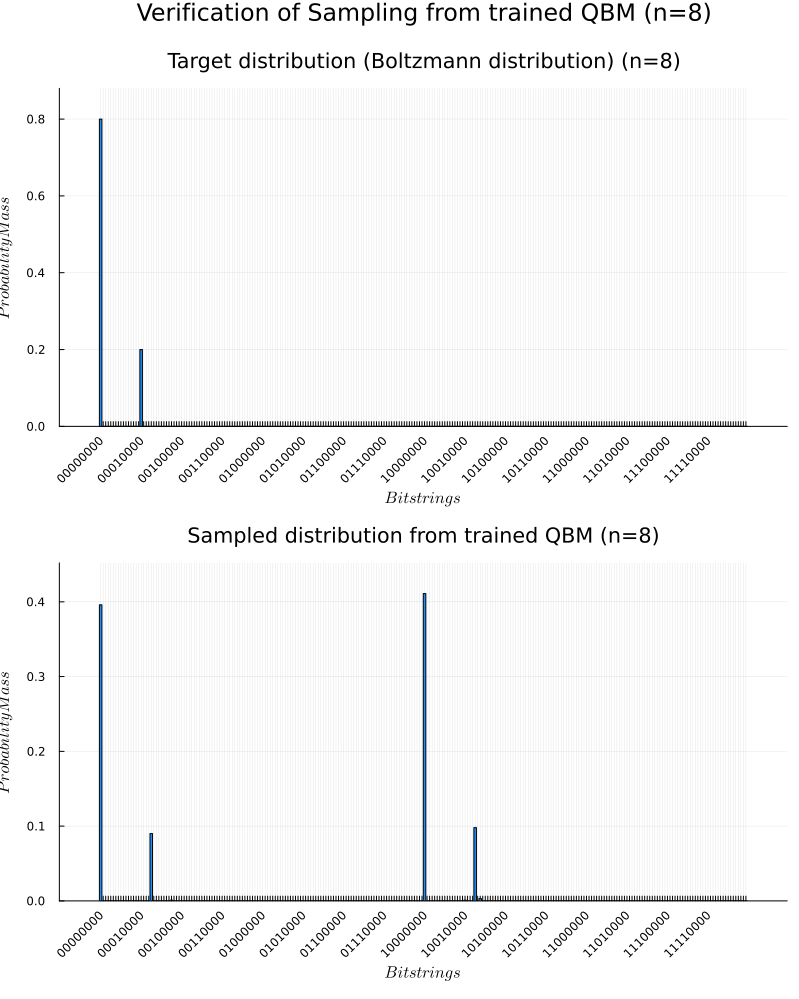

In [38]:
# 2. Visual Verification
p_original = plot_classical_distribution(nq, bitstrings, probs, 
                                         "Target distribution (Boltzmann distribution)")

p_empirical = plot_classical_distribution(nq, bitstrings, empirical_probs, 
                                        "Sampled distribution from trained QBM")

# Combine plots for visual comparison
plot(p_original, p_empirical, layout=(2, 1), size=(800, 1000), 
     plot_title="Verification of Sampling from trained QBM (n=$(nq))")

In [39]:
tv = total_variation_distance(probs, empirical_probs)

0.604

## with truncation

In [40]:
field_scale = 0.5       # typical order of magnitude for 1-local terms
coupling_scale = 0.3    # typical order for 2-local terms
rng = MersenneTwister(30)

# Initialize all parameters randomly
params = parameters(
    :heisenberg_fields, nq;
    init = :randn,
    field_scale = field_scale,
    coupling_scale = coupling_scale,
    rng = rng
)
beta = rand(rng, Uniform(1, 10));

In [41]:
num_layers_qbm = nq * 10
max_weight_qbm = nq

8

In [42]:
min_abs_coeff_qbm_list = [2.0^-4, 2.0^-6, 2.0^-8, 2.0^-10]

results = Dict{Float64, Optim.MultivariateOptimizationResults}()
f_traces = Dict{Float64, Vector{Float64}}()
g_traces = Dict{Float64, Vector{Float64}}()

trained_H = Dict{Float64, Any}()

Dict{Float64, Any}()

In [43]:
for min_abs_coeff_qbm in min_abs_coeff_qbm_list

    println("\nRunning optimization with min_abs_coeff_qbm = $(min_abs_coeff_qbm)")

    qbm_H_paulis = makehamiltonian(params; connectivity=:nearest, periodic=false) * beta
    initial_coeffs = coeffs_from_paulistrings(qbm_H_paulis)

    result = optimize(
        coeffs -> loss_fun(
            coeffs,
            qbm_H_paulis,
            target_eta_matrix,
            target_probs
        ),

        (g, coeffs) -> grad_fun!(
            g,
            coeffs,
            qbm_H_paulis,
            target_eta_matrix,
            nq,
            num_layers_qbm,
            max_weight_qbm,
            min_abs_coeff_qbm
        ),

        initial_coeffs,
        LBFGS(),
        opt
    )

    results[min_abs_coeff_qbm] = result
    f_traces[min_abs_coeff_qbm] = Optim.f_trace(result)
    g_traces[min_abs_coeff_qbm] = Optim.g_norm_trace(result)
    trained_H[min_abs_coeff_qbm] = qbm_H_paulis
end



Running optimization with min_abs_coeff_qbm = 0.0625
Iter     Function value   Gradient norm 
     0     9.181732e+00     1.000000e+00
 * Current step size: 1.0
 * time: 7.295608520507812e-5
 * g(x): [0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.7999999999999999, 0.0, 0.6, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.6, 0.0, 0.0, 0.6, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999, 0.0, 0.0, 0.9999999999999999]
 * x: [-0.8402310391840544, 0.32567654584014255, 0.3473704756179638, 0.3278260234767812, 0.1196687931000143, 1.0986271953633167, 0.609387427935801, -0.7249346303104143, -0.16445844773313223, 0.22415464456238776, 0.46388245313832743, -0.23531524117355182, 0.4340500365259236, 0.17660698749675677, 0.39014166451814897, 0.21163012008919976, 0.5305967942786776, 0.24595472836587357,

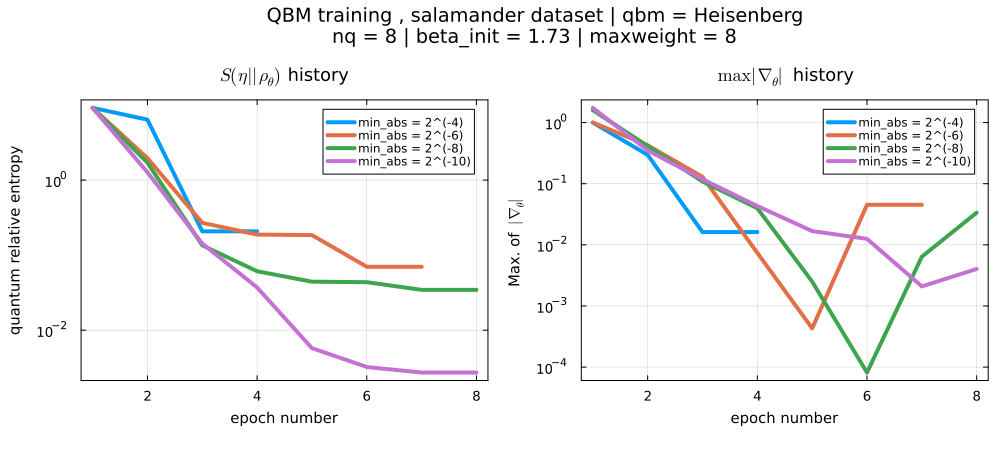

In [48]:
gr()

p1 = plot(
    xlabel = "epoch number",
    ylabel = "quantum relative entropy",
    yaxis = :log10,
    title = "\n\n" * string(L"S\left(\!\eta || \!\rho\!_\theta\!\right)", " history"),
    lw = 5,
    titlefont = font(12),
    guidefont = font(10),
    tickfont = font(9),
    margin = 5mm,
    framestyle = :box
)

for (i, min_abs) in enumerate(min_abs_coeff_qbm_list)
    plot!(
        p1,
        f_traces[min_abs],
        lw = 4,
        label = "min_abs = 2^(-$(round(Int, log2(1 / min_abs))))"
    )
end

p2 = plot(
    xlabel = "epoch number",
    ylabel = "Max. of  " * L"|\!\nabla\!_\theta|",
    yaxis = :log10,
    title = "\n\n" * string(L"\max |\!\nabla\!_\theta|", " history"),
    lw = 5,
    titlefont = font(12),
    guidefont = font(10),
    tickfont = font(9),
    margin = 5mm,
    framestyle = :box
)

for min_abs in min_abs_coeff_qbm_list
    plot!(
        p2,
        g_traces[min_abs],
        lw = 4,
        label = "min_abs = 2^(-$(round(Int, log2(1 / min_abs))))"
    )
end

combined = plot(
    p1, p2,
    layout = (1, 2),
    size = (1000, 450),
    plot_title =
        "QBM training , salamander dataset | qbm = Heisenberg\n" *
        "nq = $(nq) | beta_init = $(round(beta, digits=2)) | maxweight = $(max_weight_qbm)",
    plot_titlefont = font(13),
    bottom_margin = 9mm,
    left_margin = 5mm,
    right_margin = 1mm,
    top_margin = 10mm,
    spacing = 10mm
)

display(combined)


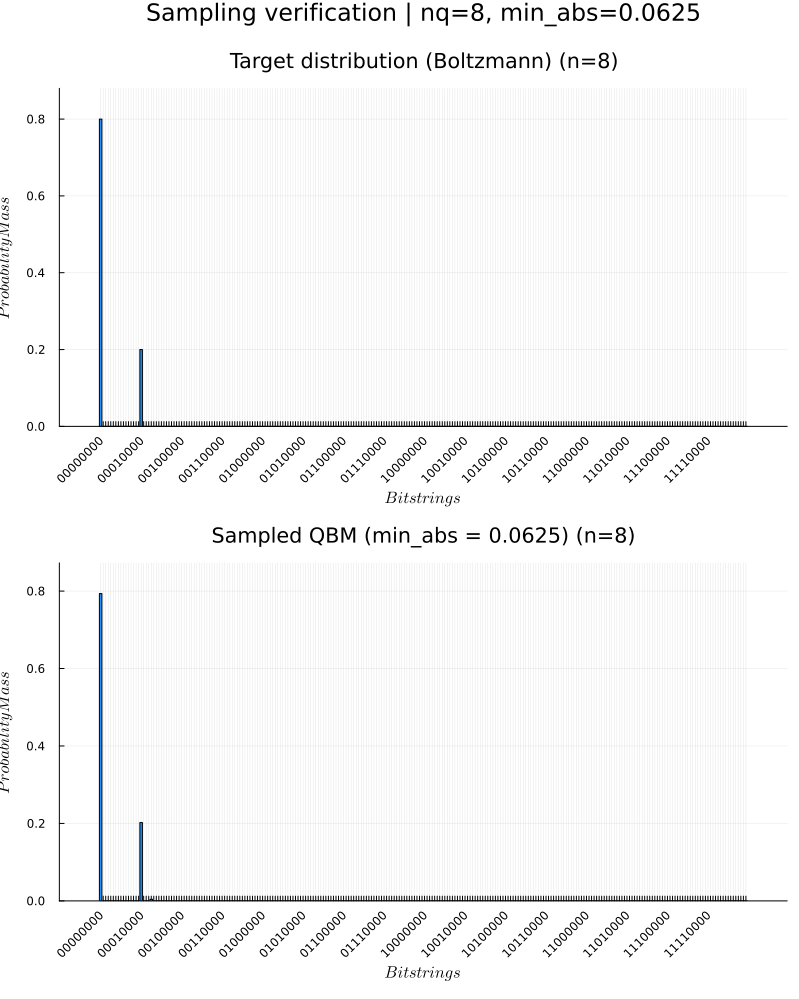

TV 0.0625 = 0.006500000000000029
TV 0.015625 = 0.022099999999999998
TV 0.00390625 = 0.009900000000000051
TV 0.0009765625 = 0.014300000000000045


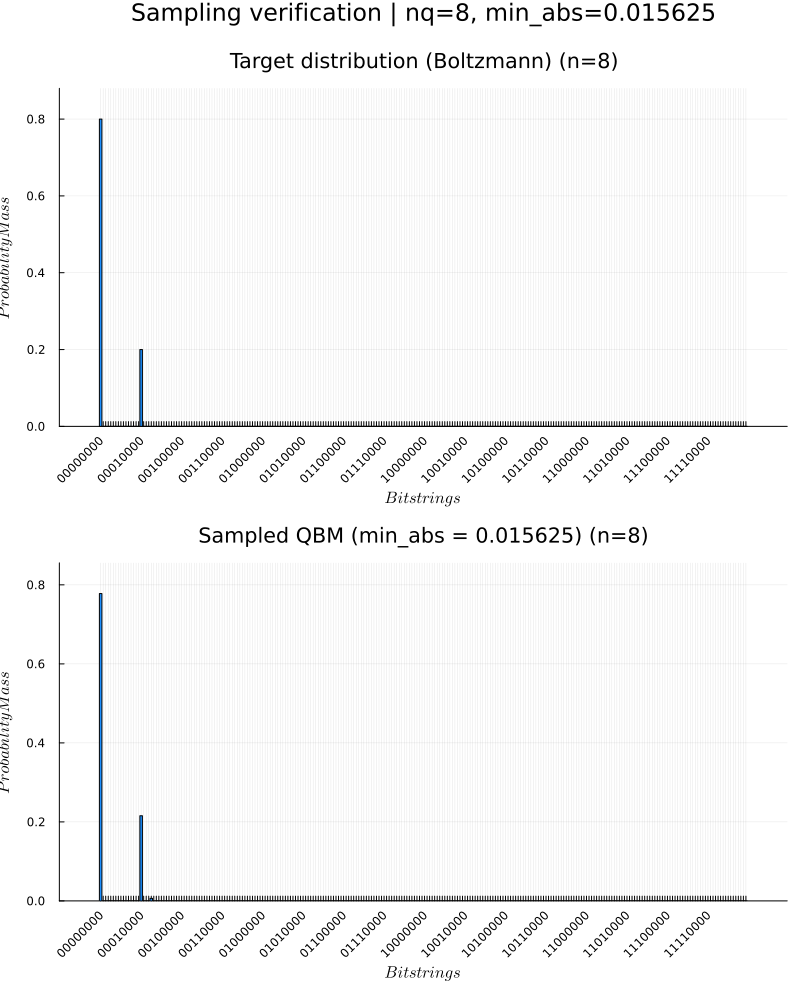

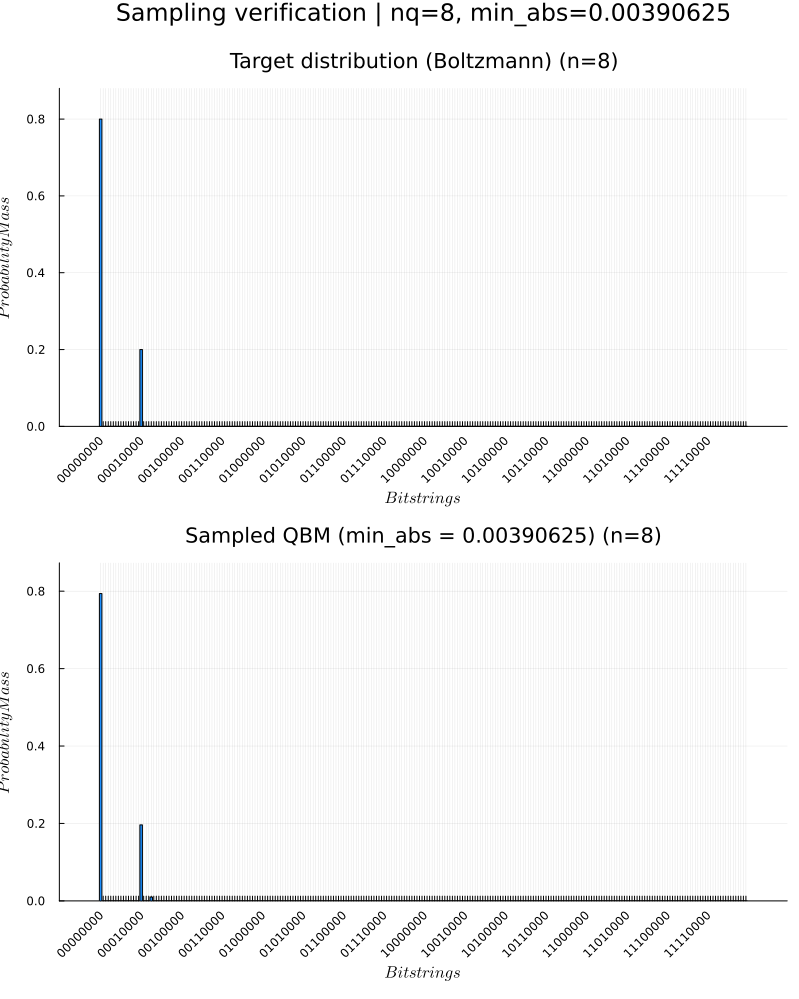

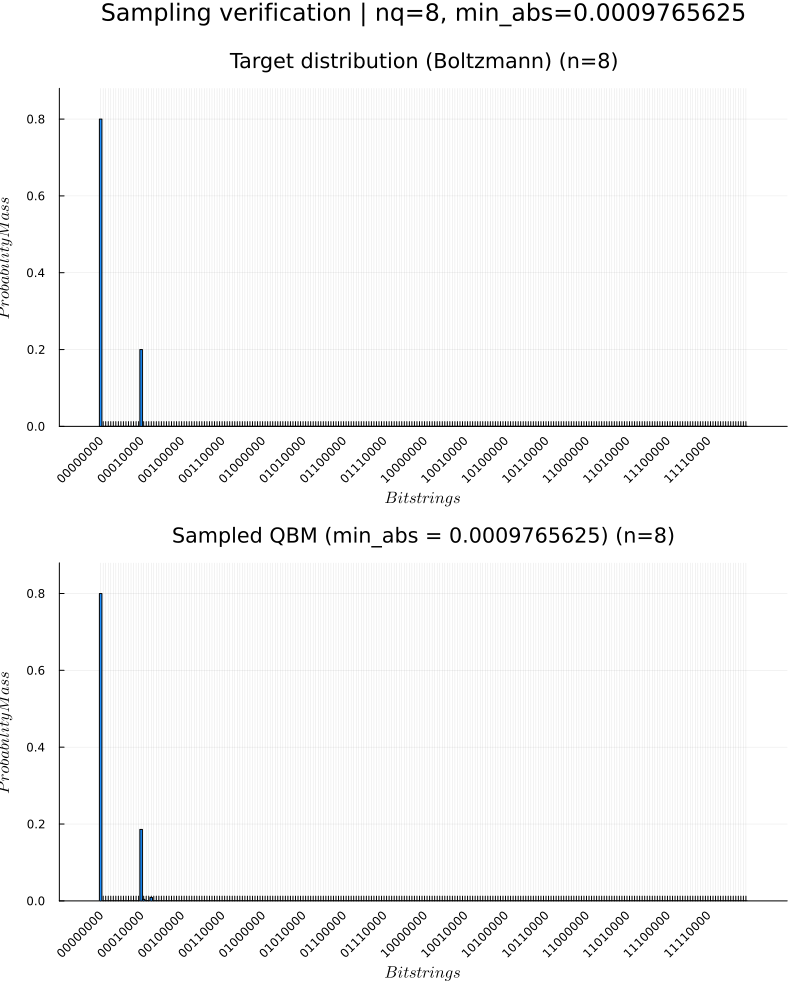

In [50]:
 for min_abs_coeff_qbm in min_abs_coeff_qbm_list
    circuit, theta = paulistringtocircuit(trained_H[min_abs_coeff_qbm])

    rho = makethermalstate(
        nq,
        circuit,
        theta,
        num_layers_qbm;
        max_weight = max_weight_qbm,
        min_abs_coeff = min_abs_coeff_qbm
    )

    samples = 10_000
    counts = zeros(Int, 2^nq)

    for _ in 1:samples
        bitstring = sample_bitstring(rho; prob_method = :approx)
        index = foldl((acc, b) -> 2 * acc + b, reverse(bitstring), init = 0) + 1
        counts[index] += 1
    end

    empirical_probs = counts ./ samples

    # ============================================================
    # Visual verification
    # ============================================================
    p_original = plot_classical_distribution(
        nq,
        bitstrings,
        probs,
        "Target distribution (Boltzmann)"
    )

    p_empirical = plot_classical_distribution(
        nq,
        bitstrings,
        empirical_probs,
        "Sampled QBM (min_abs = $(min_abs_coeff_qbm))"
    )

    display(
        plot(
            p_original,
            p_empirical,
            layout = (2, 1),
            size = (800, 1000),
            plot_title = "Sampling verification | nq=$(nq), min_abs=$(min_abs_coeff_qbm)"
        )
    )

    function total_variation_distance(p::AbstractVector, q::AbstractVector)
        length(p) == length(q) || error("Distributions must have the same length")
        return 0.5 * sum(abs.(p .- q))
    end

    tv = total_variation_distance(probs, empirical_probs)
    println("TV $(min_abs_coeff_qbm) = $(tv)")

end